In [6]:
import os
import glob
import numpy as np
import pandas as pd
import json
import cv2
import matplotlib.pyplot as plt

In [64]:
TRAINING_IMAGE_FOLDER = './data/train_images/'
train_df = pd.read_csv('./data/train.csv')
train_df.head()

,id,organ,data_source,img_height,img_width,pixel_size,tissue_thickness,rle,age,sex
0,10044,prostate,HPA,3000,3000,0.4,4,1459676 77 1462675 82 1465674 87 1468673 92 14...,37.0,Male
1,10274,prostate,HPA,3000,3000,0.4,4,715707 2 718705 8 721703 11 724701 18 727692 3...,76.0,Male
2,10392,spleen,HPA,3000,3000,0.4,4,1228631 20 1231629 24 1234624 40 1237623 47 12...,82.0,Male
3,10488,lung,HPA,3000,3000,0.4,4,3446519 15 3449517 17 3452514 20 3455510 24 34...,78.0,Male
4,10610,spleen,HPA,3000,3000,0.4,4,478925 68 481909 87 484893 105 487863 154 4908...,21.0,Female


In [7]:
training_image_files  = glob.glob(f"{TRAINING_IMAGE_FOLDER}/*")
print(training_image_files[0])

./data/train_images\10044.tiff


In [8]:
image = cv2.imread(training_image_files[0])
print(image.shape)

(3000, 3000, 3)


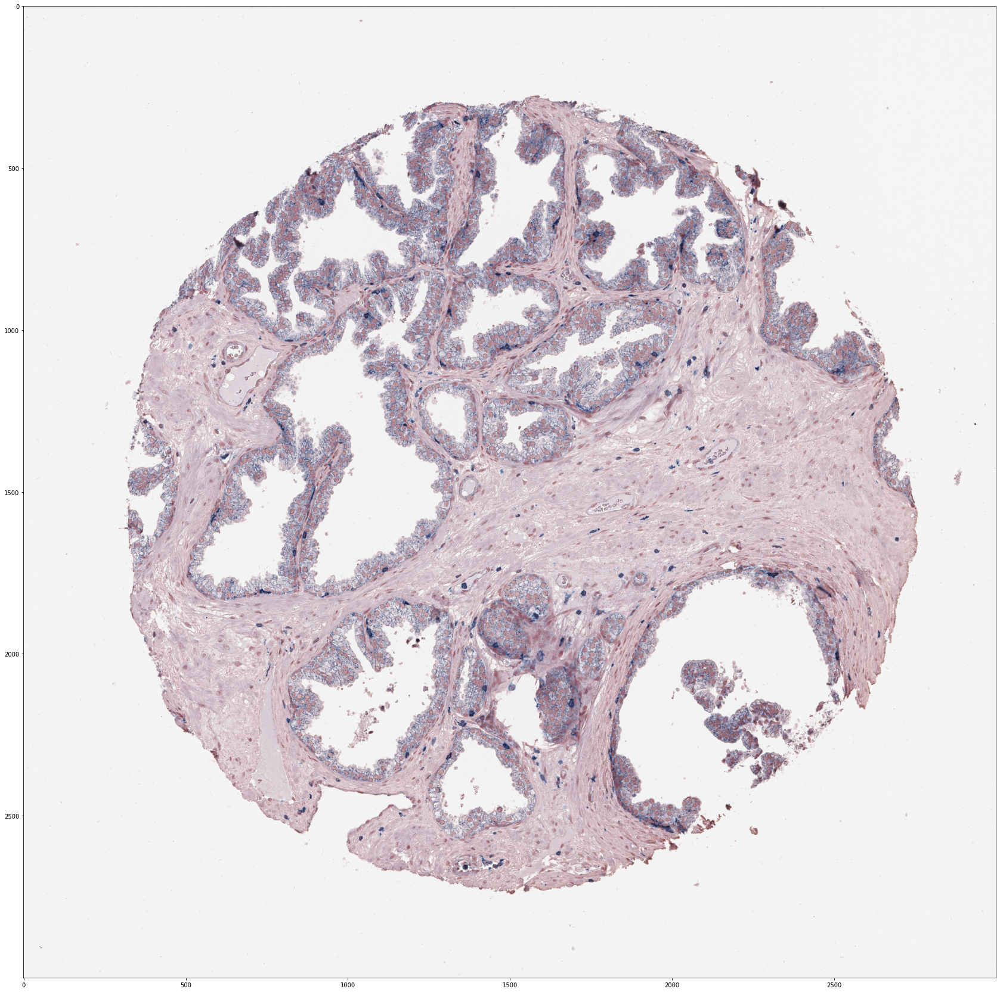

In [10]:
plt.figure(figsize=(30, 30))
plt.imshow(image)

In [12]:
print(image.dtype, image.min(), image.max())

uint8 22 245


In [13]:
training_annots_files = glob.glob(f"{TRAINING_IMAGE_ANNOT}/*")
print(training_annots_files[0])

./data/train_annotations\10044.json


In [15]:
# Get image id
def get_id(path):
    return os.path.basename(path).split(".")[0]
image_id = get_id(training_image_files[0])
print(image_id)

10044


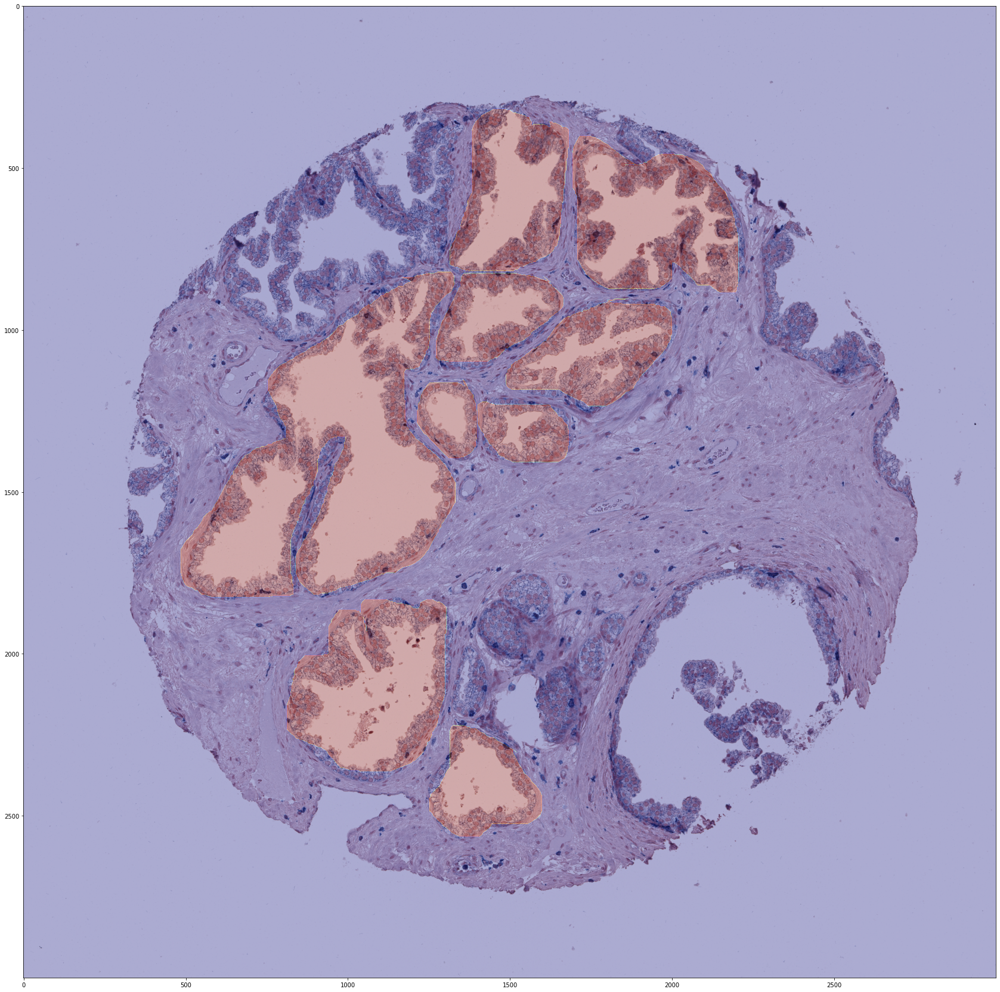

In [72]:
def rle_decode(mask_rle, shape):
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T

def get_mask_by_id(image_id, shape = (3000, 3000)):
    rle = train_df["rle"][0]
    mask = rle_decode(rle, shape)
    return mask

mask = get_mask_by_id(image_id)
plt.figure(figsize=(30, 30))
plt.imshow(image)
plt.imshow(mask, alpha=0.3, cmap='jet')
plt.show()

,id,organ,data_source,img_height,img_width,pixel_size,tissue_thickness,rle,age,sex
0,10044,prostate,HPA,3000,3000,0.4,4,1459676 77 1462675 82 1465674 87 1468673 92 14...,37.0,Male
1,10274,prostate,HPA,3000,3000,0.4,4,715707 2 718705 8 721703 11 724701 18 727692 3...,76.0,Male
2,10392,spleen,HPA,3000,3000,0.4,4,1228631 20 1231629 24 1234624 40 1237623 47 12...,82.0,Male
3,10488,lung,HPA,3000,3000,0.4,4,3446519 15 3449517 17 3452514 20 3455510 24 34...,78.0,Male
4,10610,spleen,HPA,3000,3000,0.4,4,478925 68 481909 87 484893 105 487863 154 4908...,21.0,Female


In [76]:
print(np.unique(train_df["organ"]))

['kidney' 'largeintestine' 'lung' 'prostate' 'spleen']
